# **Домашнее задание №1 (base). Часть 1**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;

**Максимальная оценка за дз**
> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.**

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [2]:
%%capture
#!pip install ydata-profiling
#!pip install streamlit

In [3]:
%%capture
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re
import pickle
from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_squared_error as MSE

random.seed(42)
np.random.seed(42)

Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Для воспроизводимости результатов, так как большинство "рандомных" действий в питоне таковыми не являются, а на самом деле подчиняются определенным логикам распределения.

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.5 балла)**

Вы уже встречались с pandas в первой половине семестра. Теперь будем постоянно (кроме некоторых случаев) использовать его для анализа данных и наслаивать навыки. Выполните операции, направленные на практику основных действий с `pandas`:

**0.1 балла**
- [ ] Отобразите 30 случайных строк тренировочного датасета.
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения
- [ ] Посмотрите, есть ли в данных явные дубликаты


**0.2 балла**
Ответьте на вопросы:
- [ ] Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?
- [ ] Достаточно ли метода duplicated для анализа дубликатов? Почему?

**0.15 балла**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)

#### 30 случайных строк

In [5]:
random.seed(17)
df_train.sample(n=30)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


#### 5 первых и последних значений

In [6]:
df_test.head(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [7]:
df_test.tail(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


> - Выводы о чем можно сделать, используя случайные/верхние/нижние строки? А о чем нельзя?


1. Можно получить общее представление о типах данных, их формате, диапазоне значений.
2. Нельзя однозначно сделать выводы о распределении переменных, взаимосвязях, наличии пропусков и аномалий, а также о "похожести" данных (т.е. их распределений) в тренировочном и тестовом датафреймах.

#### Дашборды

In [8]:
ProfileReport(df_train, title="Дашборд для тренировочного датафрейма")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 22.38it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
ProfileReport(df_test, title="Дашборд для тестового датафрейма")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 18.89it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Пропуски в тренировочной таблице

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


Пропуски есть аж в пяти столбцах, и их довольно много - не менее 190 в каждом, что составляет около 2,7%. Относительно общего количества наблюдений пропусков немного, но в дальнейшем все равно необходимо обработать их.

#### Пропуски в тестовой таблице

In [11]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


ЗДесь также есть пропуски в тех же столбцах, но их меньше как абсолютно, так и относительно. По 19 значений в каждом столбце, то есть 1,9% наблюдений. Тем не менее, их также необходимо обработать в будущем.

Мы обнаружили пропуски. Теперь избавимся от них.

**(0.05 балла)**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

#### Заполняем пропуски

Так как все столбцы, в которых есть пропуски, содержат в себе строки (а torque, например, представлен в крайне инопланетном для обывателя виде), обработаем их соответственно. Переведем в строки, а дальше посчитаем средние значения по первым "словам" в этой строке, т.е. числам. Злополучный torque содержит в себе два числа, второе из которых - обороты в минуту в двигателе. В ходе изучения вопроса было решено, что данное значение бесполезно и учитываться не будет.

In [12]:
df_train['mileage'] = df_train['mileage'].astype('string')
df_train['engine'] = df_train['engine'].astype('string')

In [13]:
mean_mileage = sum([float(str(i).split()[0]) for  i in list(df_train['mileage']) if str(i).split()[0] != '<NA>']) / len([float(str(i).split()[0]) for  i in list(df_train['mileage']) if str(i).split()[0] != '<NA>'])
mean_engine = round(sum([float(str(i).split()[0]) for  i in list(df_train['engine']) if str(i).split()[0] != '<NA>']) / len([float(str(i).split()[0]) for  i in list(df_train['engine']) if str(i).split()[0] != '<NA>']))
mean_power = sum(float(re.findall(r'[\d.]+', str(i))[0]) for i in df_train['max_power'] if re.findall(r'[\d.]+', str(i))) / sum(1 for i in df_train['max_power'] if re.findall(r'[\d.]+', str(i)))
mean_torque = sum(float(re.findall(r'[\d.]+', str(i))[0]) for i in df_train['torque'] if re.findall(r'[\d.]+', str(i))) / sum(1 for i in df_train['torque'] if re.findall(r'[\d.]+', str(i)))

In [14]:
%%capture
df_train['mileage'].fillna(f'{mean_mileage} kmpl', inplace=True)
df_train['engine'].fillna(f'{mean_engine} CC', inplace=True)
df_train['max_power'].fillna(f'{mean_power} bhp', inplace=True)
df_train['torque'].fillna(mean_torque, inplace=True)
df_train['seats'].fillna(round(df_train['seats'].mean()), inplace=True)

In [15]:
#Отдельный случай
df_train['max_power'] = df_train['max_power'].replace(r'^\D*$', f'{mean_power} bhp', regex=True)

In [16]:
%%capture
df_test['mileage'].fillna(f'{mean_mileage} kmpl', inplace=True)
df_test['engine'].fillna(f'{mean_engine} CC', inplace=True)
df_test['max_power'].fillna(f'{mean_power} bhp', inplace=True)
df_test['torque'].fillna(mean_torque, inplace=True)
df_test['seats'].fillna(round(df_train['seats'].mean()), inplace=True)

Теперь все пропуски заполнены. Так как они встречались в обеих таблицах, средние значения, посчитанные по тренировочным данным, были внесены в оба датафрейма.  
P.S. Также был дополнительно обработан случай в max_engine, который всплыл в дальнейшем. В столбце встречалось не совсем NaN-значение, которое просто не содержало в себе число, а было только строкой 'bhp'. Далее, при переводе столбца в числовой тип, ячейка пустела и мешала дальнейшей работе. В итоге это значение также было заменено на '{mean_power} bhp'

#### Дубликаты



> -  Посмотрите, есть ли в данных явные дубликаты.   
Заодно сразу избавимся от них, так как дубликаты не несут в себе никакой пользы и только занимают память.



In [17]:
df_train.drop_duplicates(inplace=True)
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6014 entries, 0 to 6996
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6014 non-null   object 
 1   year           6014 non-null   int64  
 2   selling_price  6014 non-null   int64  
 3   km_driven      6014 non-null   int64  
 4   fuel           6014 non-null   object 
 5   seller_type    6014 non-null   object 
 6   transmission   6014 non-null   object 
 7   owner          6014 non-null   object 
 8   mileage        6014 non-null   string 
 9   engine         6014 non-null   string 
 10  max_power      6014 non-null   object 
 11  torque         6014 non-null   object 
 12  seats          6014 non-null   float64
dtypes: float64(1), int64(3), object(7), string(2)
memory usage: 657.8+ KB


In [18]:
df_test.drop_duplicates(inplace=True)
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 938 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           938 non-null    object 
 1   year           938 non-null    int64  
 2   selling_price  938 non-null    int64  
 3   km_driven      938 non-null    int64  
 4   fuel           938 non-null    object 
 5   seller_type    938 non-null    object 
 6   transmission   938 non-null    object 
 7   owner          938 non-null    object 
 8   mileage        938 non-null    object 
 9   engine         938 non-null    object 
 10  max_power      938 non-null    object 
 11  torque         938 non-null    object 
 12  seats          938 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 102.6+ KB


По уменьшевшемуся кол-ву измерений в обоих таблицах сразу видно, что дубликаты были. В тренировочном датафрейме они вообще составили практически 1/7 всех данных.



> - Достаточно ли метода duplicated для анализа дубликатов? Почему?  


Нет, не достаточно. Метод полезен для выявления полных повторов строк, но не выявляет частичные дубликаты или логические дубликаты, когда практически одинаковые наблюдения представлены в разных строках с небольшими отличиями (например, в целевой переменной).

### **Задание 2 (0.5 балла)**

На прошлом шаге вы рассмотрели дубликаты. Однако дубликат может быть связан с не только полным повторением информации в нескольких строках, но и частиным. Например, объект мог был внесен в базу данных с разным значением целевой переменной. В этом шаге займемся такими дублями!

**Ваши действия:**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)

In [19]:
cols = list(df_train.columns[:2]) + list(df_train.columns[3:])

In [20]:
df_train.duplicated(subset=cols)

,0
0,False
1,False
2,False
3,False
4,False
...,...
6992,False
6993,False
6994,False
6995,False


In [21]:
len(df_train.duplicated(subset=cols)[df_train.duplicated(subset=cols) == True])

174

In [22]:
len(df_test.duplicated(subset=cols)[df_test.duplicated(subset=cols) == True])

7

Да, в данных есть неполные дубликаты. 174 в тренировочном датафрейме и 7 в тестовом.



> - [ ] Отобразите такие объекты (0.15 балла)


В таблице ниже четко видны строки-"двойняшки" с разными ценами.

In [23]:
df_train.loc[df_train.duplicated(subset=cols), :].sort_values(by='name')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
370,BMW X4 M Sport X xDrive20d,2019,5400000,7500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
766,Chevrolet Beat Diesel LT,2012,200000,70000,Diesel,Individual,Manual,Second Owner,25.44 kmpl,936 CC,57.6 bhp,150Nm@ 1750rpm,5.0
4704,Chevrolet Beat Diesel LT,2012,165000,70000,Diesel,Individual,Manual,Second Owner,25.44 kmpl,936 CC,57.6 bhp,150Nm@ 1750rpm,5.0
6599,Chevrolet Enjoy 1.3 TCDi LS 8,2016,525000,80000,Diesel,Individual,Manual,First Owner,18.2 kmpl,1248 CC,73.74 bhp,172.5Nm@ 1750rpm,8.0
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5365,Toyota Innova 2.5 V Diesel 7-seater,2011,700000,250000,Diesel,Individual,Manual,Second Owner,12.8 kmpl,2494 CC,102 bhp,20.4@ 1400-3400(kgm@ rpm),7.0
1495,Volkswagen Ameo 1.5 TDI Comfortline,2017,560000,52000,Diesel,Individual,Manual,First Owner,21.66 kmpl,1498 CC,108.62 bhp,250Nm@ 1500-3000rpm,5.0
5263,Volkswagen Polo 1.2 MPI Comfortline,2016,385000,40000,Petrol,Individual,Manual,Second Owner,16.2 kmpl,1199 CC,74 bhp,110Nm@ 3000-4300rpm,5.0
2244,Volkswagen Vento Diesel Highline,2012,375000,90000,Diesel,Individual,Manual,First Owner,20.54 kmpl,1598 CC,103.6 bhp,250Nm@ 1500-2500rpm,5.0


In [24]:
df_test.loc[df_test.duplicated(subset=cols), :].sort_values(by='name')

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
906,Chevrolet Enjoy 1.3 TCDi LS 7,2016,420000,110000,Diesel,Individual,Manual,Second Owner,18.2 kmpl,1248 CC,73.74 bhp,172.5Nm@ 1750rpm,7.0
725,Maruti Alto 800 LXI,2018,310000,30000,Petrol,Individual,Manual,First Owner,24.7 kmpl,796 CC,47.3 bhp,69Nm@ 3500rpm,5.0
857,Maruti Swift Dzire VXI 1.2,2018,650000,15000,Petrol,Individual,Manual,First Owner,21.21 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
892,Maruti Swift VDI,2013,409999,100000,Diesel,Individual,Manual,Third Owner,22.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
919,Maruti Swift VXI Optional,2015,450000,30000,Petrol,Individual,Manual,First Owner,20.4 kmpl,1197 CC,81.80 bhp,113Nm@ 4200rpm,5.0
221,Volkswagen Vento 1.5 Highline Plus AT 16 Alloy,2018,885000,75000,Diesel,Individual,Automatic,First Owner,21.5 kmpl,1498 CC,108.5 bhp,250Nm@ 1500-3000rpm,5.0
924,Volkswagen Vento Diesel Highline,2011,300000,100000,Diesel,Individual,Manual,Second Owner,20.54 kmpl,1598 CC,103.6 bhp,250Nm@ 1500-2500rpm,5.0


- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)   
Для полных дубликатов сделано ранее, для частичных - ниже.

   
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)   


In [25]:
df_train.drop_duplicates(subset=cols, inplace=True)
df_test.drop_duplicates(subset=cols, inplace=True)

In [26]:
df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.




* [ ] Приведите тип данных к ``float``.

In [27]:
df_train['mileage'] = ([float(str(i).split()[0]) for  i in list(df_train['mileage']) if str(i).split()[0] != '<NA>'])
df_train['engine'] = ([float(str(i).split()[0]) for  i in list(df_train['engine']) if str(i).split()[0] != '<NA>'])
df_train['max_power'] = [float(re.findall(r'[\d.]+', str(i))[0]) if re.findall(r'[\d.]+', str(i)) else None for i in df_train['max_power']] #исправил чат
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [28]:
df_test['mileage'] = ([float(str(i).split()[0]) for  i in list(df_test['mileage']) if str(i).split()[0] != '<NA>'])
df_test['engine'] = ([float(str(i).split()[0]) for  i in list(df_test['engine']) if str(i).split()[0] != '<NA>'])
df_test['max_power'] = [float(re.findall(r'[\d.]+', str(i))[0]) if re.findall(r'[\d.]+', str(i)) else None for i in df_test['max_power']] #исправил чат
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96 Nm at 3000 rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
926,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.04Nm@ 4500rpm,5.0
927,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.7Nm@ 4000rpm,5.0
928,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,22.4 kgm at 1750-2750rpm,5.0
929,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.8Nm@ 4000rpm,5.0


Проверяем типы данных:

In [29]:
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,float64


In [30]:
df_test.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,float64


* [ ] Удалите столбец ``torque``

In [31]:
df_train = df_train.drop('torque', axis = 1)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,5.0


In [32]:
df_test = df_test.drop('torque', axis = 1)
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
926,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,5.0
927,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,5.0
928,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0
929,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,5.0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [33]:
df_train = df_train.astype({'seats': int, 'engine': int})
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,int64


In [34]:
df_test = df_test.astype({'seats': int, 'engine': int})
df_test.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,int64


### **Задание 5 (0.15 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сделайте вывод.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

### Train

In [35]:
numer = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']
categor = ['name', 'fuel', 'seller_type', 'transmission', 'owner']

In [36]:
df_train[numer].describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.432644,1436.137329,88.210097,5.426712
std,4.095622,5.354320e+05,6.007114e+04,3.985958,484.562519,31.627183,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.426604,1248.000000,81.860000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,14.000000


In [37]:
df_train[categor].describe()

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


#### Числовые признаки
Автомобили в основном с 2010–2017 гг., минимальный 1983, максимальный 2020, среднее значение примерно совпадает с медианным.По цене и пробегу есть аномально большие значения до 10 млн. и 2,36 млн.соответственно. Большинство авто имеют стандартные 5 мест; помимо этого, есть некий лимузин на 14 мест.



#### Категориальные признаки

Всех категорий, не считая названия от 2-х до 5 в каждом столбце. Самая распространенная в обьявлениях модель - Maruti Swift Dzire VDI, наиболее популярный тип топлива дизель, а управление - механика.    
  <br>
### Test

In [38]:
df_test[numer].describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,931.000000,9.310000e+02,931.000000,931.000000,931.000000,931.000000,931.000000
mean,2013.506982,5.501182e+05,72786.747583,19.380436,1439.770140,88.758572,5.409237
std,4.043408,5.987156e+05,48823.924040,3.994492,515.204547,32.703931,0.924622
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.000000,34.200000,4.000000
25%,2011.000000,2.500000e+05,39000.000000,16.500000,1196.500000,68.050000,5.000000
50%,2014.000000,4.200000e+05,65000.000000,19.426604,1248.000000,82.850000,5.000000
75%,2017.000000,6.500000e+05,100000.000000,22.320000,1498.000000,100.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,32.260000,3604.000000,280.000000,9.000000


In [39]:
df_test[categor].describe()

,name,fuel,seller_type,transmission,owner
count,931,931,931,931,931
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,14,498,813,839,562


#### Числовые признаки
По числовым признакам тестовый датафрейм схож с тренировочным, все основные статистики примерно совпадают между собой.



#### Категориальные признаки
Категориальные же признаки почти что идентичны, и даже самая распространенная марка машины совпадает в двух таблицах (та же Maruti, но другой модели)  

### Вывод
Можно предположить, что данные, на которых модель будет обучаться, и данные, на которых будет проверяться её результативность, достаточно похожи. В дальнейшем, предварительно, не должно возникнут проблем с плохим качеством модели. Однако для более точной оценки похожести необходимо обратиться к графикам и числам.   
<br>

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### Числовые признаки

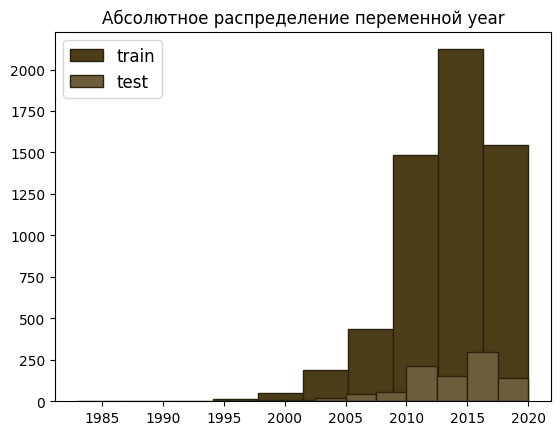

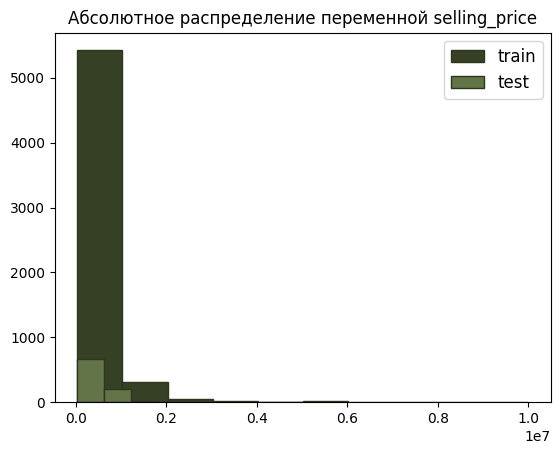

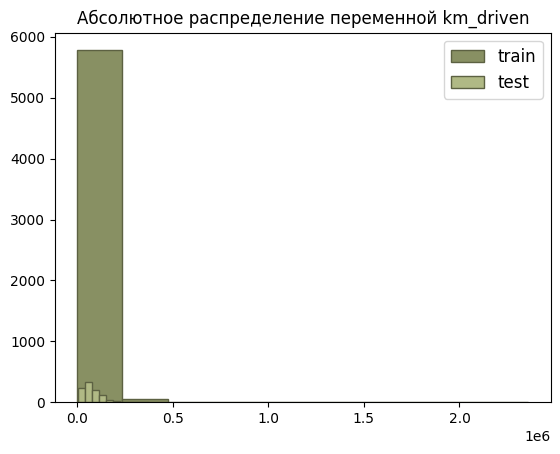

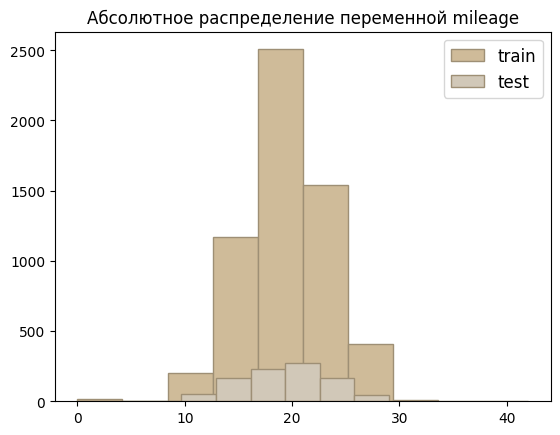

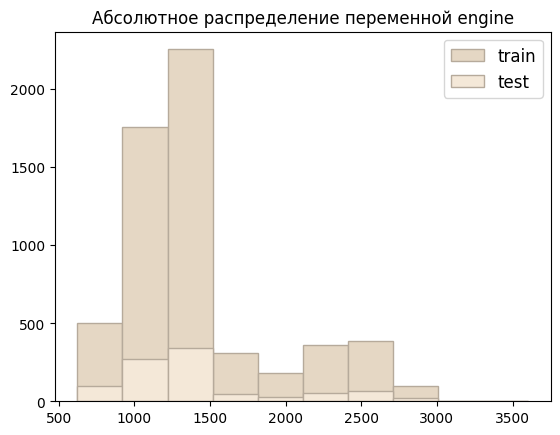

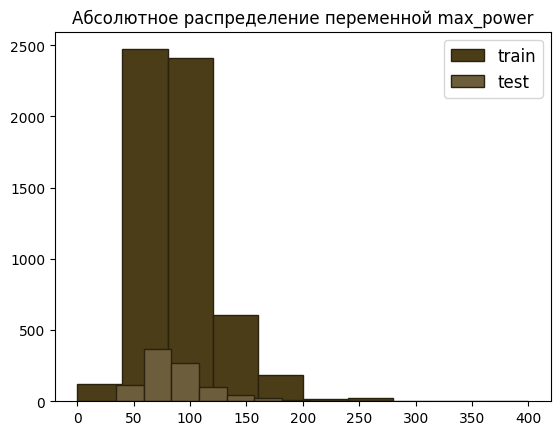

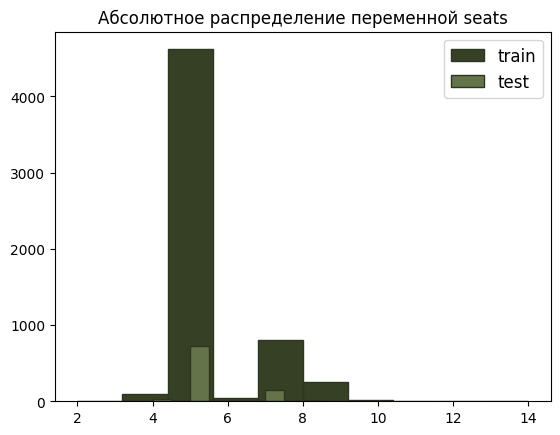

In [40]:
colors_train = ['#4C3D19', '#354024', '#889063', '#CFBB99', '#E5D7C4']
colors_test = ['#6c5e3d', '#637449', '#b0b985', '#d1c8b8', '#f4e8d8']
colors_edges = ['#29220e', '#2d361f', '#5c6142', '#9e8f75', '#b6aa9b']
i = 0
k = 1
for col in numer:
  plt.title (f'Абсолютное распределение переменной {col}')
  plt.hist(df_train[col], edgecolor = colors_edges[i], color = colors_train[i], label='train')
  plt.hist(df_test[col], edgecolor = colors_edges[i], color = colors_test[i], label='test')
  plt.legend(fontsize=12)
  i = (i + 1) % 5
  plt.show()

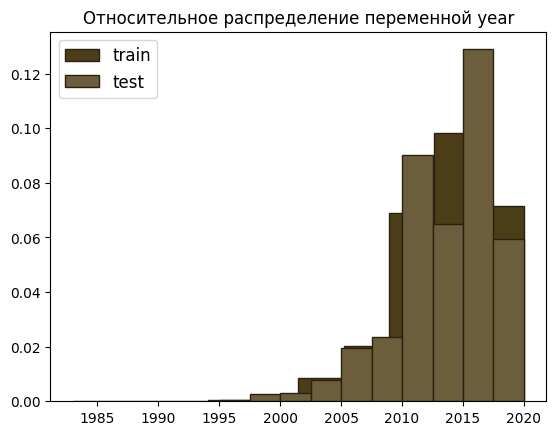

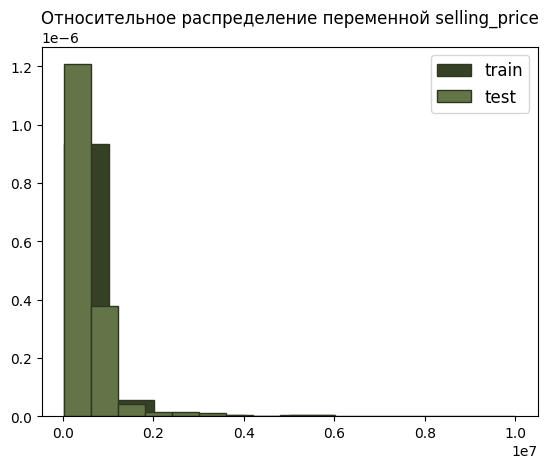

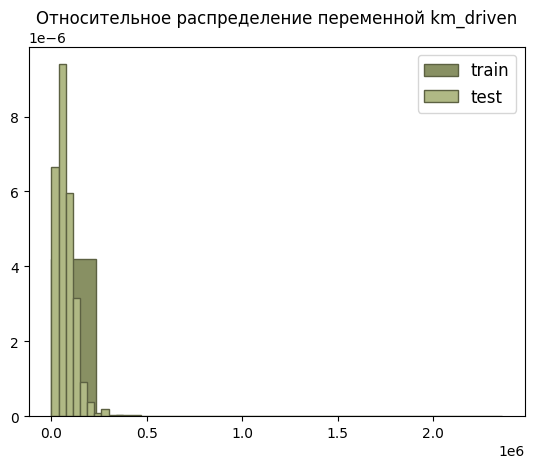

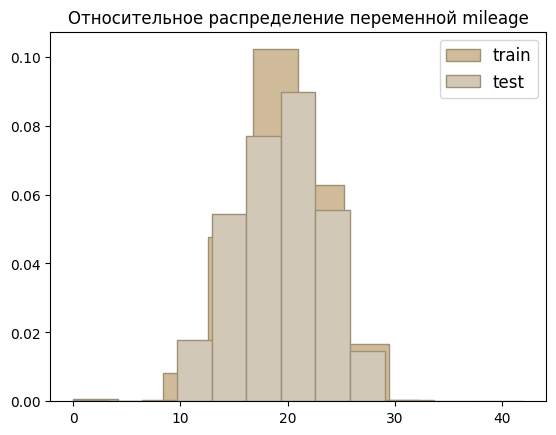

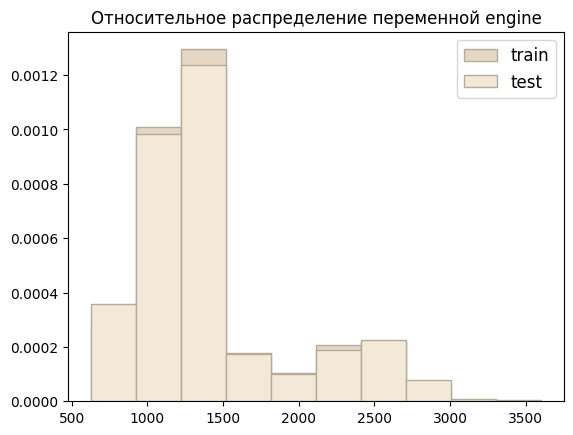

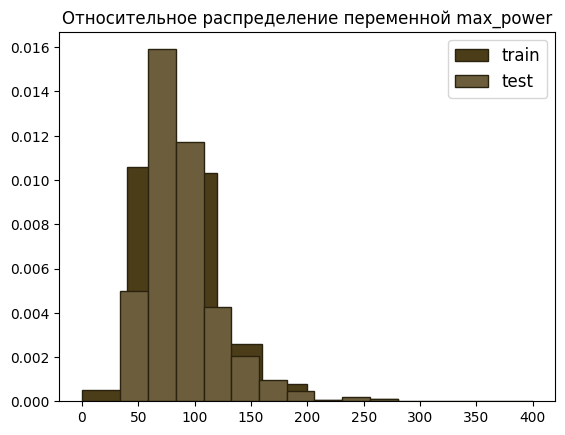

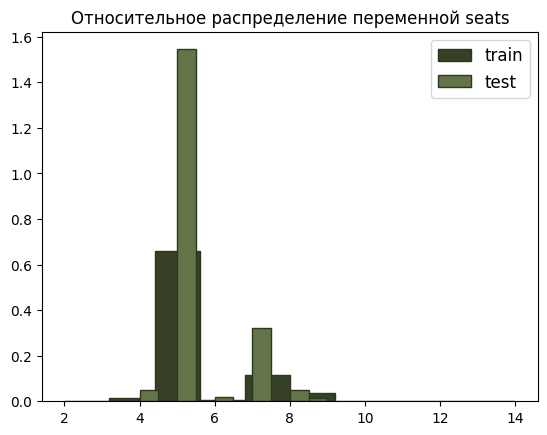

In [41]:
i = 0
for col in numer:
  plt.title (f'Относительное распределение переменной {col}')
  plt.hist(df_train[col], edgecolor = colors_edges[i], color = colors_train[i], density = True, label='train')
  plt.hist(df_test[col], edgecolor = colors_edges[i], color = colors_test[i], density = True, label='test')
  plt.legend(fontsize=12)
  i = (i + 1) % 5
  plt.show()

В первом чанке построены графики с абсолютными распределениями. В нем видно, что в тестовой таблице (более светлые столбцы - во имя эстетики пришлось пожертвовать очевидностью легенды) по большей части соблюдают тенденции тренировочной. Проверка во втором чанке путем построения относительных распределений подтверждает это. Следовательно, информация в двух датафреймах имеет схожую конституцию, что означает хорошее качество разбиения на выборки.

### Категориальные признаки

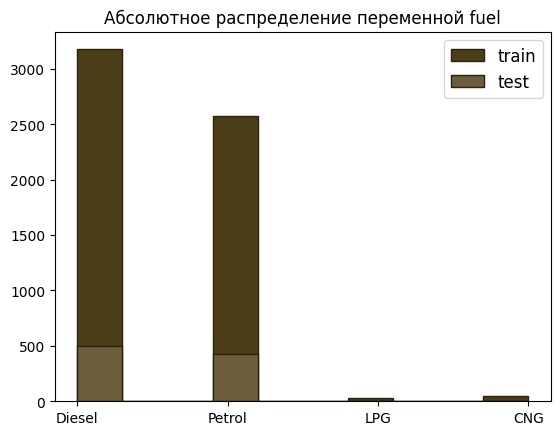

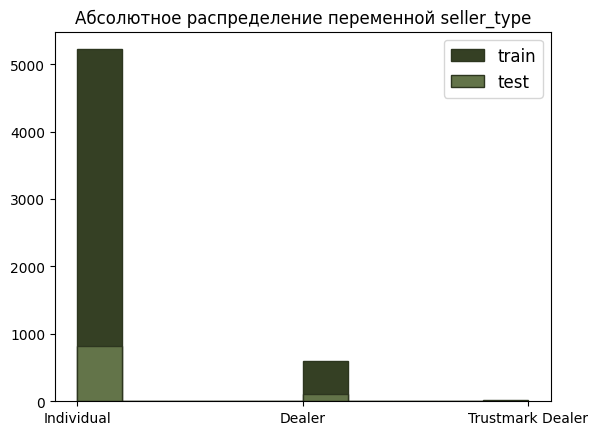

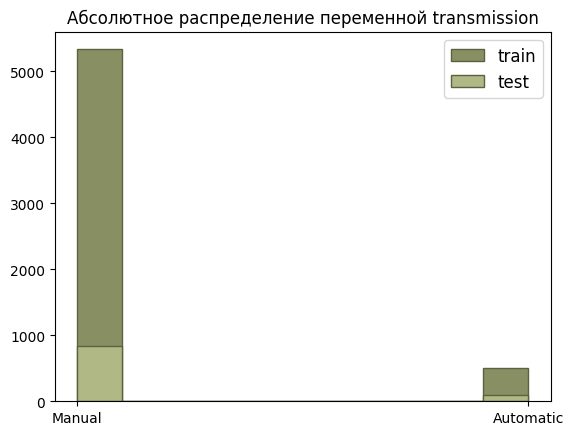

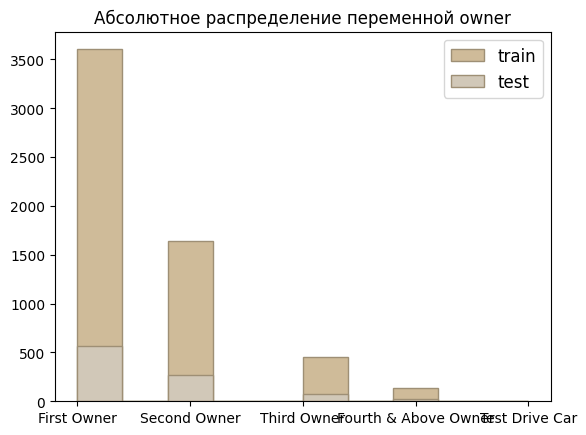

In [42]:
i = 0
for col in categor[1:]:
  plt.hist (df_train[col], edgecolor = colors_edges[i], color = colors_train[i], label='train')
  plt.title (f'Абсолютное распределение переменной {col}')
  plt.hist (df_test[col], edgecolor = colors_edges[i], color = colors_test[i], label='test')
  plt.legend(fontsize=12)
  i = (i + 1) % 5
  plt.show()

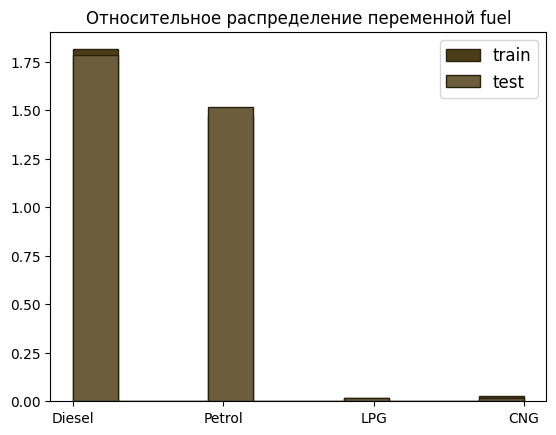

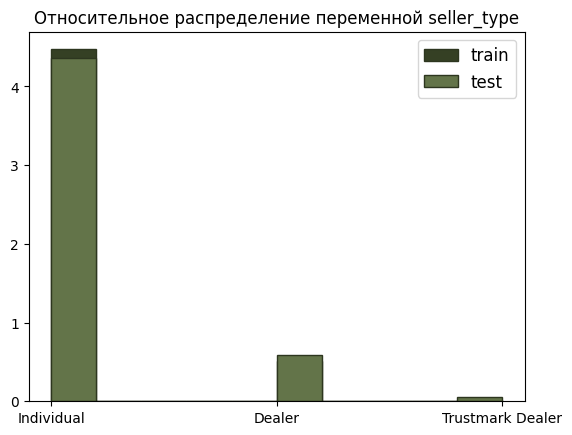

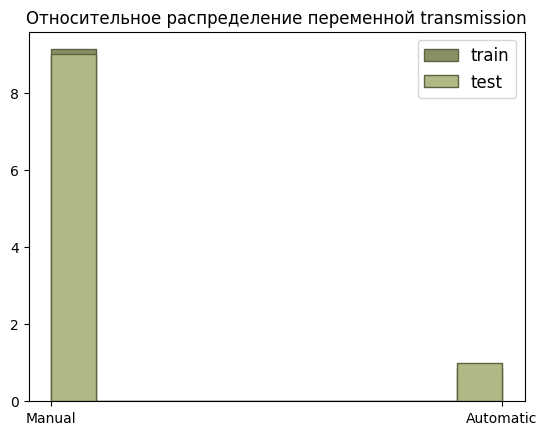

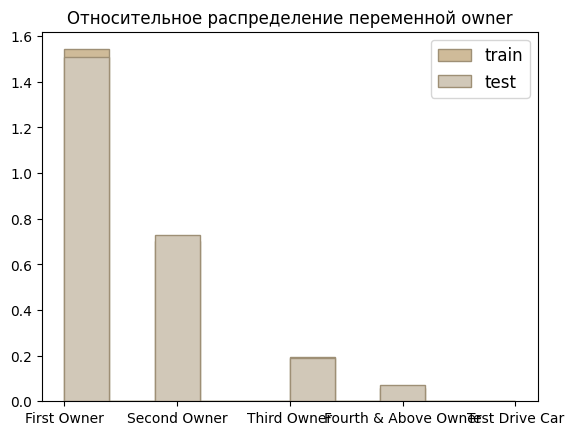

In [43]:
i = 0
for col in categor[1:]:
  plt.title (f'Относительное распределение переменной {col}')
  plt.hist(df_train[col], edgecolor = colors_edges[i], color = colors_train[i], density = True, label='train')
  plt.hist(df_test[col], edgecolor = colors_edges[i], color = colors_test[i], density = True, label='test')
  plt.legend(fontsize=12)
  i = (i + 1) % 5
  plt.show()

Здесь ситуация еще более наглядная. На графиках с относительными распределениями столбцы практически совпадают, значит, наши тестовые данные очень похожи на обучающие.

Теперь рассмотрим связь переменных с ценой. Рассматривать будем только тренировочную таблицу, так как у нас в полевых условиях нет таргета в тестовых данных, так что такой анализ не имеет практического смысла.

In [44]:
numer.remove('selling_price')

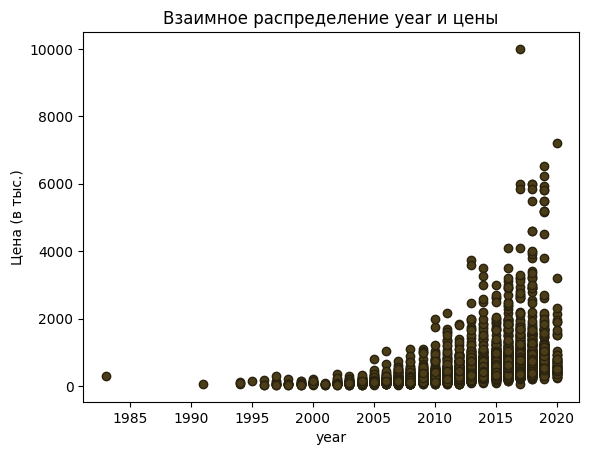

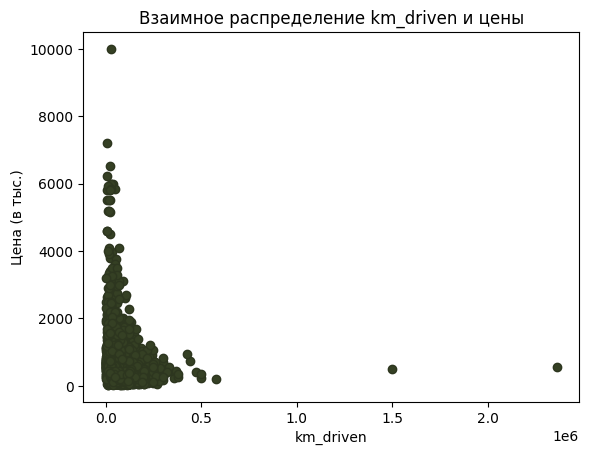

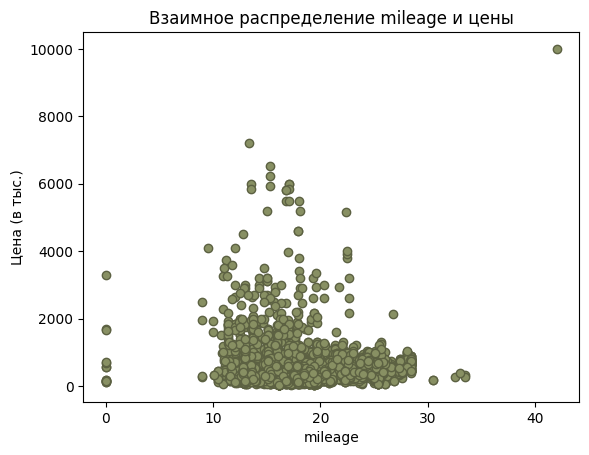

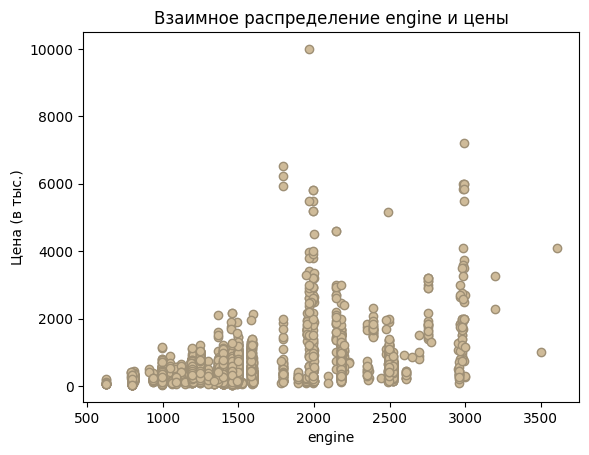

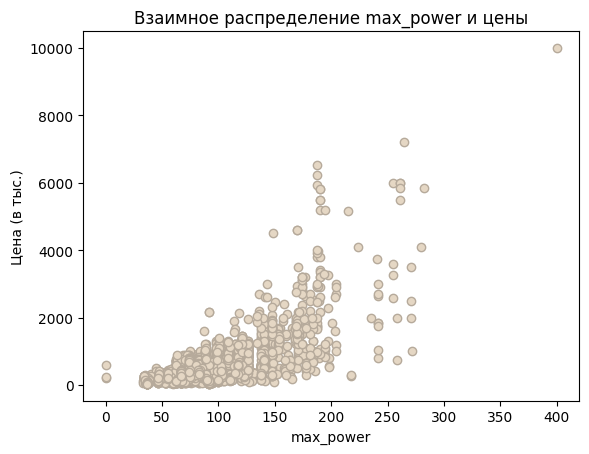

In [45]:
i = 0
numer.remove('seats')
for col in numer:
  plt.scatter(x = df_train[col], y = df_train['selling_price']/1000, edgecolor = colors_edges[i], color = colors_train[i])
  plt.title(f'Взаимное распределение {col} и цены')
  plt.xlabel(col)
  plt.ylabel('Цена (в тыс.)')
  i = (i + 1) % 5
  plt.show()

In [46]:
numer.append('seats')

При наглядном рассмотрении созависимости целевой переменной (пришлось учитывать цену в тысячах, так как иначе графики были нерепрезентативны) и вещественных признаков можно сделать несколько выводов.  
* Во-первых, большинство продаваемых машин - новые. Чем позднее год выпуска, тем больше предложений с такими машинами.  
* Во-вторых, пробег имеет несколько выбросов, однако подавляющее большинство предложений сосредоточены в 0-20% от максимума.
* В-третьих, кажется,  судя по mileage, train содержит волшебные а-ля электромобили, которые совершенно не потребляют топливо. По хорошему, необходимо также заменить эти выбросы, однако невозможно точно сказать, насколько это дейтствие правомерно. Возможно, машины сломаны и продаются на запчасти, или действительно являются электрокарами...
* В-четвертых, мощность и объём бензина - это единственные переменные, которые демонстрируют какую-никакую наглядную взаимосвязь. Что, в общем-то, логично - чем мощнее машина, тем она обыкновенно дороже.

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

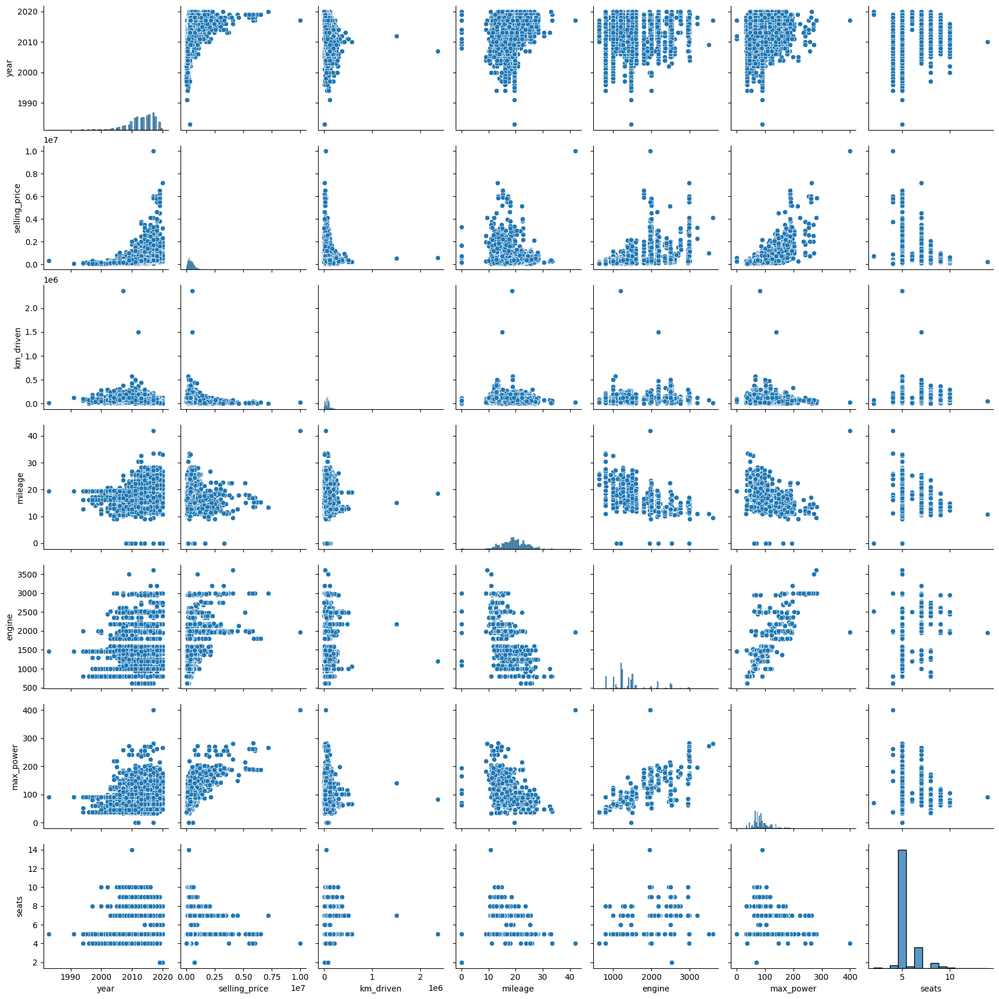

In [47]:
sns.pairplot (df_train)

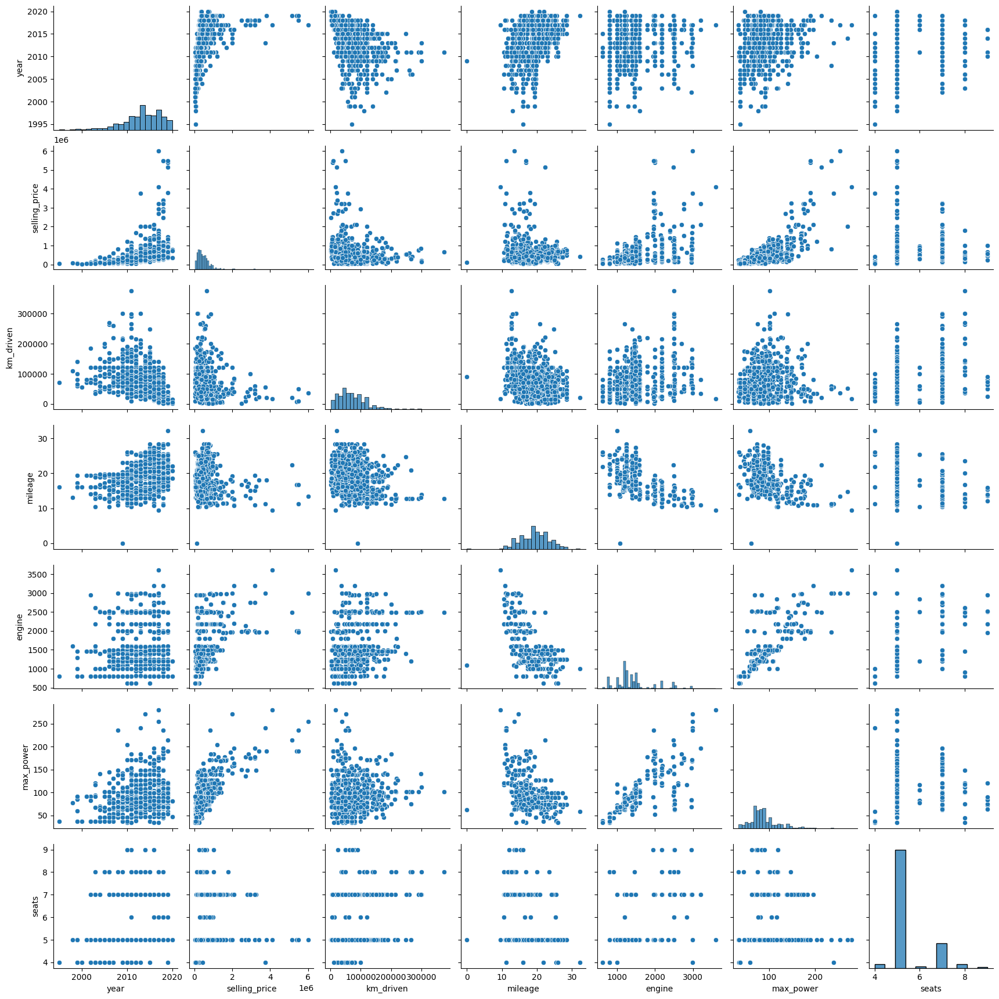

In [48]:
sns.pairplot(df_test)

В таком представлении довольно сложно судить, однако исходя из графиков предыдущего пункта, скорее всего да, распределения очень похожи.

### **Задание 7 (0.5 балла)**

Итак, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [49]:
numer.append('selling_price')

In [50]:
df_train[numer].corr()

,year,km_driven,mileage,engine,max_power,seats,selling_price
year,1.000000,-0.368966,0.340654,-0.017973,0.142129,0.041178,0.427279
km_driven,-0.368966,1.000000,-0.181956,0.234283,0.027442,0.192328,-0.164828
mileage,0.340654,-0.181956,1.000000,-0.574387,-0.373780,-0.451258,-0.105021
engine,-0.017973,0.234283,-0.574387,1.000000,0.680096,0.647656,0.441030
max_power,0.142129,0.027442,-0.373780,0.680096,1.000000,0.240201,0.687727
seats,0.041178,0.192328,-0.451258,0.647656,0.240201,1.000000,0.149953
selling_price,0.427279,-0.164828,-0.105021,0.441030,0.687727,0.149953,1.000000


<Axes: >

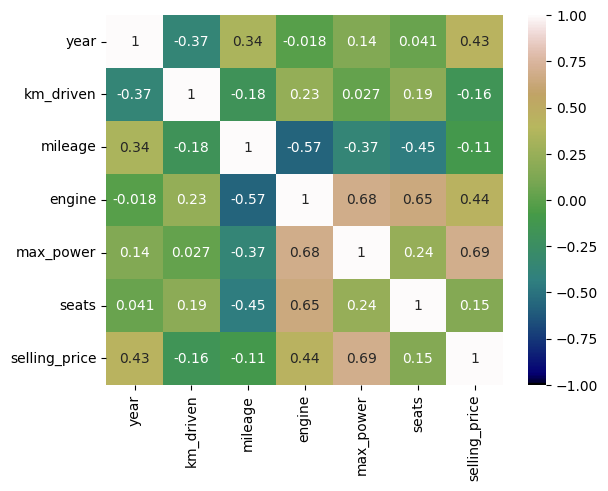

In [51]:
sns.heatmap(
    df_train[numer].corr(),
    cmap='gist_earth',
    annot=True,
    vmin=-1, vmax=1)

> - [ ] Ответьте на вопросы:




>  - Какие 2 признака наименее скоррелированы между собой?  


 Среди признаков меньше всего коррелируют между собой год и объём двигателя: корреляция примерно –0.018, то есть связь совершенно отсутствует. ЧТо логично.

<br>

>  - Между какими наблюдается довольно сильная положительная линейная зависимость?  


 Довольно сильная положительная зависимость наблюдается между мощностью двигателя и объёмом двигателя. Корреляция около 0.68 указывает на тесную линейную связь. Можно сказать, взаимосвязь ожидаемая: чем больше двигатель отдает, тем больше ресурсов он требует и потребляет.

<br>

>  - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?  


Помимо интуитивного предположения, что за бОльший срок машина успеет проехать больше, у нас также есть корреляция между годом и пробегом. Она отрицательная и достаточно средняя (около –0.37), что говорит о незначительной обратной взаимосвязи. В целом, нельзя утверждать это с уверенностью, однако натянуто предположить вполне можно.

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Сделайте тренировочный и тестовый наборы. Сделайте на тренировочный и тестовый наборы. Она уже даны, достаточно просто отделить целевой признак Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных. Используйте уже имеющиеся данные train и test при разбиении. Если считаете уместным применить какую-то более хитрую технику разбиения — примените, но опишите, зачем.

In [52]:
train = df_train[numer]
test = df_test[numer]

In [53]:
y_train = train['selling_price']
numer.remove('selling_price')
X_train = train[numer]

In [54]:
train.describe()

,year,km_driven,mileage,engine,max_power,seats,selling_price
count,5840.000000,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5.840000e+03
mean,2013.428425,7.395224e+04,19.432644,1436.137329,88.210097,5.426712,5.229601e+05
std,4.095622,6.007114e+04,3.985958,484.562519,31.627183,0.982344,5.354320e+05
min,1983.000000,1.000000e+00,0.000000,624.000000,0.000000,2.000000,2.999900e+04
25%,2011.000000,3.900000e+04,16.950000,1197.000000,68.000000,5.000000,2.500000e+05
50%,2014.000000,7.000000e+04,19.426604,1248.000000,81.860000,5.000000,4.050000e+05
75%,2017.000000,1.000000e+05,22.300000,1498.000000,99.000000,5.000000,6.400000e+05
max,2020.000000,2.360457e+06,42.000000,3604.000000,400.000000,14.000000,1.000000e+07


In [55]:
y_test = test['selling_price']
X_test = test[numer]

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.


In [56]:
model = LinearRegression()
model.fit(X_train, y_train)
y_pred_test = model.predict (X_test)
y_pred_train = model.predict (X_train)

**Примечание**: так как в дальнейшем будем строить несколько моделей, для удобства сравнения также создается таблица, состоящая из названия модели и ее оценок. В ней MSE будут указаны разделенные на 1000^2 (т.е. средняя квадратичная ошибка цены в тысячах), так как иначе такие большие числа крайне неудобно воcпринимать; r-squared же округлим до четырех знаков после запятой.

In [57]:
results = pd.DataFrame(columns=[
    'model',
    'mse_train', 'r2_train',
    'mse_test',  'r2_test'
])

In [58]:
results.loc[len(results)] = [
    'Linear regression',
    round(MSE(y_train, y_pred_train)/1000000,2), round(r2_score(y_train, y_pred_train),4),
    round(MSE(y_test, y_pred_test)/1000000,2),  round(r2_score(y_test, y_pred_test),4)]


In [59]:
results

,model,mse_train,r2_train,mse_test,r2_test
0,Linear regression,117092.89,0.5915,138017.66,0.6146


Среднее отклонение порядка 130 тысяч (корень MSE), а r^2 около 0,6. Значения довольно средние, но далекие от того, чтобы называться хорошими.

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [60]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [61]:
%%capture
model_scaled = LinearRegression()
model_scaled.fit(X_train_scaled, y_train)
y_pred_train_scaled = model_scaled.predict(X_train_scaled)
y_pred_test_scaled = model_scaled.predict(X_test_scaled)

In [62]:
results.loc[len(results)] = [
    'Linear regression (scaled)',
    round(MSE(y_train, y_pred_train_scaled)/1000000,2), round(r2_score(y_train, y_pred_train_scaled),4),
    round(MSE(y_test, y_pred_test_scaled)/1000000,2),  round(r2_score(y_test, y_pred_test_scaled),4)]

In [63]:
results

,model,mse_train,r2_train,mse_test,r2_test
0,Linear regression,117092.89,0.5915,138017.66,0.6146
1,Linear regression (scaled),117092.89,0.5915,138017.66,0.6146


Качество модели вообще не изменилось. Глаза боятся, но руки продолжают делать и улучшать.

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [64]:
model_scaled.coef_

array([160763.57615997, -42906.5008312 ,  25451.24496502,  60613.56753658,
       320292.40215653, -22791.15448765])

In [65]:
numer

['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']

Самый значимый признак - максимальня мощность, а на втором месте с большим отрывом год выпуска. Результат ожидаемый, так как даже без этих данных можно предположить, что чем мощнее и новее машина, тем она дороже.

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [66]:
model_lasso = Lasso(1000)
model_lasso.fit(X_train_scaled, y_train)
y_pred_train_lasso = model_lasso.predict(X_train_scaled)
y_pred_test_lasso = model_lasso.predict(X_test_scaled)

In [67]:
results.loc[len(results)] = [
    'Lasso',
    round(MSE(y_train, y_pred_train_lasso)/1000000,2), round(r2_score(y_train, y_pred_train_lasso),4),
    round(MSE(y_test, y_pred_test_lasso)/1000000,2),  round(r2_score(y_test, y_pred_test_lasso),4)]

In [68]:
results

,model,mse_train,r2_train,mse_test,r2_test
0,Linear regression,117092.89,0.5915,138017.66,0.6146
1,Linear regression (scaled),117092.89,0.5915,138017.66,0.6146
2,Lasso,117102.74,0.5915,138186.63,0.6141


In [69]:
model_lasso.coef_

array([160439.4651073 , -41817.17359864,  23669.70866291,  55895.79273552,
       321168.57379436, -19946.20756461])

Ни один коэффициент не занулен. В данном случае это происходит потому, что  признаков довольно мало, и каждый из них действительно вносит вклад в модель. Другими словами, ни один признак не является полностью избыточным или неинформативным, поэтому Lasso сохраняет их всех.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [70]:
parameters = {'alpha' : [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]}
grid = GridSearchCV(model_lasso, param_grid = parameters, cv = 10, scoring={'mse': 'neg_mean_squared_error', 'r2': 'r2'}, refit = 'mse')
grid.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=Lasso(alpha=1000),
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100,
                                   1000, 10000]},
             refit='mse',
             scoring={'mse': 'neg_mean_squared_error', 'r2': 'r2'})

In [71]:
grid.best_params_

{'alpha': 1000}

In [72]:
best = grid.best_estimator_
best.coef_

array([160439.4651073 , -41817.17359864,  23669.70866291,  55895.79273552,
       321168.57379436, -19946.20756461])

In [73]:
y_pred_train_lasso_best = best.predict(X_train_scaled)
y_pred_test_lasso_best = best.predict(X_test_scaled)

In [74]:
results.loc[len(results)] = [
    'Lasso (GSCV best)',
    round(MSE(y_train, y_pred_train_lasso_best)/1000000,2), round(r2_score(y_train, y_pred_train_lasso_best),4),
    round(MSE(y_test, y_pred_test_lasso_best)/1000000,2),  round(r2_score(y_test, y_pred_test_lasso_best),4)]

In [75]:
results

,model,mse_train,r2_train,mse_test,r2_test
0,Linear regression,117092.89,0.5915,138017.66,0.6146
1,Linear regression (scaled),117092.89,0.5915,138017.66,0.6146
2,Lasso,117102.74,0.5915,138186.63,0.6141
3,Lasso (GSCV best),117102.74,0.5915,138186.63,0.6141


Количество обучений: alpha * cv = 10 \* 10 = 100
<br>
Лучший коэффициент - 1000.
Веса не занулились, причина скорее всего та же: параметров слишком мало и они не мультиколлинеарны, чтобы попросту их отбрасывать.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [76]:
parameters = {'alpha' : [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000], 'l1_ratio': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}
net = ElasticNet()
grid_net = GridSearchCV (net, param_grid = parameters, cv = 10, scoring={'mse': 'neg_mean_squared_error', 'r2': 'r2'}, refit = 'mse')
grid_net.fit(X_train_scaled, y_train)

grid_net.best_params_

{'alpha': 0.1, 'l1_ratio': 0.9}

Обучено моделей: alpha \* l1_ratio * cv = 10 \* 10 * 10 = 1 000.

Лучшие результаты модель показывает при значениях alpha = 0,1 и l1 = 0,9. Посмотрим на них:

In [77]:
%%capture
best = grid_net.best_estimator_
y_pred_train_net = best.predict(X_train_scaled)
y_pred_test_net = best.predict(X_test_scaled)

In [78]:
results.loc[len(results)] = [
    'ElasticNet',
    round(MSE(y_train, y_pred_train_net)/1000000,2), round(r2_score(y_train, y_pred_train_net),4),
    round(MSE(y_test, y_pred_test_net)/1000000,2),  round(r2_score(y_test, y_pred_test_net),4)]

In [79]:
results

,model,mse_train,r2_train,mse_test,r2_test
0,Linear regression,117092.89,0.5915,138017.66,0.6146
1,Linear regression (scaled),117092.89,0.5915,138017.66,0.6146
2,Lasso,117102.74,0.5915,138186.63,0.6141
3,Lasso (GSCV best),117102.74,0.5915,138186.63,0.6141
4,ElasticNet,117108.21,0.5914,138359.36,0.6136


Малое количество признаков делает регуляризацию почти бесполезной для отбора. Lasso и ElasticNet слегка "сжимают" коэффициенты,поэтому существенного изменения результатов не происходит, ведь модель скорее просто "нормализуется".

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


**Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [80]:
data_train = df_train.drop('name', axis = 1)
data_test = df_test.drop('name', axis = 1)
categor.remove('name')

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

**Бонус 0.25 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления. Если предобработали столбец — можно закомментировать assert  
<br>

Для начала посмотрим на наши данные:

In [81]:
categor.append('name')

In [82]:
df_train['name'].describe()

,name
count,5840
unique,1924
top,Maruti Swift Dzire VDI
freq,91


In [83]:
sorted(df_train['name'].unique())[:40]

['Ambassador CLASSIC 1500 DSL AC',
 'Ambassador Classic 2000 DSZ AC PS',
 'Ambassador Grand 2000 DSZ PW CL',
 'Audi A3 35 TDI Premium Plus',
 'Audi A3 40 TFSI Premium',
 'Audi A4 1.8 TFSI',
 'Audi A4 2.0 TDI',
 'Audi A4 2.0 TDI 177 Bhp Premium Plus',
 'Audi A4 35 TDI Premium Plus',
 'Audi A6 2.0 TDI',
 'Audi A6 2.0 TDI  Design Edition',
 'Audi A6 2.0 TDI Technology',
 'Audi A6 35 TFSI Matrix',
 'Audi Q3 2.0 TDI Quattro Premium Plus',
 'Audi Q3 35 TDI Quattro Premium Plus',
 'Audi Q3 35 TDI Quattro Technology',
 'Audi Q5 2.0 TDI',
 'Audi Q5 3.0 TDI Quattro',
 'Audi Q5 35TDI Premium Plus',
 'Audi Q5 45 TDI quattro Technology',
 'Audi Q7 3.0 TDI Quattro',
 'Audi Q7 3.0 TDI Quattro Premium Plus',
 'Audi Q7 35 TDI Quattro Premium',
 'BMW 3 Series 320d',
 'BMW 3 Series 320d Corporate Edition',
 'BMW 3 Series 320d GT Luxury Line',
 'BMW 3 Series 320d Highline',
 'BMW 3 Series 320d Luxury Line',
 'BMW 3 Series 320d Luxury Line Plus',
 'BMW 3 Series 320d Luxury Plus',
 'BMW 3 Series 320d Presti

Много одинаковых моделей с разными комплектациями, информация о которых по факту указана в других столбцах (например, объём двигателя, вид топлива). Исходя из этого, можем "подчистить" названия и оставить только первые два слова в каждом, т.е. бренд и модель. Иначе весь столбик попросту нерепрезентативен.

In [84]:
#chat helped
df_train['name'] = (
    df_train['name']
      .str.split()
      .apply(lambda x: f"{x[0]} {x[1].capitalize()}" if len(x) > 1 else x[0])
)

df_test['name'] = (
    df_test['name']
      .str.split()
      .apply(lambda x: f"{x[0]} {x[1].capitalize()}" if len(x) > 1 else x[0])
)


In [85]:
sorted(df_train['name'].unique())[:20]

['Ambassador Classic',
 'Ambassador Grand',
 'Audi A3',
 'Audi A4',
 'Audi A6',
 'Audi Q3',
 'Audi Q5',
 'Audi Q7',
 'BMW 3',
 'BMW 5',
 'BMW 6',
 'BMW 7',
 'BMW X1',
 'BMW X3',
 'BMW X4',
 'BMW X6',
 'BMW X7',
 'Chevrolet Aveo',
 'Chevrolet Beat',
 'Chevrolet Captiva']

In [86]:
X_train_cat = df_train[categor]
X_train_cat.describe(include='object')

,fuel,seller_type,transmission,owner,name
count,5840,5840,5840,5840,5840
unique,4,3,2,5,203
top,Diesel,Individual,Manual,First Owner,Maruti Swift
freq,3177,5223,5336,3603,558


Теперь у нас всего 203 модели машин, по которым модель будет обучаться. Этого должно быть достаточно для качественного прогнозирования, а лишние подробности лишь приводили бы к ненужному переобучению.

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [87]:
X_test_cat = df_test[categor]

In [88]:
categor.append('seats')

In [89]:
%%capture
ohe = OneHotEncoder(drop='first', handle_unknown='ignore')

X_train_cat = ohe.fit_transform(X_train_cat)
X_test_cat = ohe.transform(X_test_cat)

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

Для начала объединим наши вещественные и (закодированные) категориальные признаки.

In [90]:
X_train_cat = pd.DataFrame(X_train_cat.toarray(), columns=ohe.get_feature_names_out(), index=X_train.index)
X_train_scaled = pd.DataFrame(X_train_scaled, columns=numer, index=X_train.index)
X_train = pd.concat([X_train_scaled, X_train_cat], axis=1)

In [91]:
X_test_cat = pd.DataFrame(X_test_cat.toarray(), columns=ohe.get_feature_names_out(), index=X_test.index)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=numer, index=X_test.index)
X_test = pd.concat([X_test_scaled, X_test_cat], axis=1)

In [92]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
ridge.fit(X_train, y_train)

parameters = {'alpha' : [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000, 10000]}
grid = GridSearchCV(estimator = ridge, param_grid = parameters, cv = 10, scoring={'mse': 'neg_mean_squared_error', 'r2': 'r2'}, refit = 'r2')
grid.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100,
                                   1000, 10000]},
             refit='r2', scoring={'mse': 'neg_mean_squared_error', 'r2': 'r2'})

In [93]:
grid.best_params_

{'alpha': 0.1}

In [94]:
y_pred_test_ridge = grid.predict(X_test)
y_pred_train_ridge = grid.predict (X_train)

In [95]:
results.loc[len(results)] = [
    'Ridge',
    round(MSE(y_train, y_pred_train_ridge)/1000000,2), round(r2_score(y_train, y_pred_train_ridge),4),
    round(MSE(y_test, y_pred_test_ridge)/1000000,2),  round(r2_score(y_test, y_pred_test_ridge),4)]

In [96]:
results

,model,mse_train,r2_train,mse_test,r2_test
0,Linear regression,117092.89,0.5915,138017.66,0.6146
1,Linear regression (scaled),117092.89,0.5915,138017.66,0.6146
2,Lasso,117102.74,0.5915,138186.63,0.6141
3,Lasso (GSCV best),117102.74,0.5915,138186.63,0.6141
4,ElasticNet,117108.21,0.5914,138359.36,0.6136
5,Ridge,28901.12,0.8992,50479.40,0.8590


Наконец, последняя модель смогла сильно улучшить предсказание. Теперь среднее отклонение (корень MSE) составило всего около 225 тысяч долларов (намного меньше, чем любая из предыдущих моделей), а значение r^2 повысилось аж до ~0,86 на тестовых данных. Становится ясно, что категориальные признаки имеют огромное влияние на качество нашего предсказания. Без них линейные модели ограничены в своей способности различать автомобили с одинаковыми числовыми характеристиками, но не учитывают, например, сегмент (люкс/эконом), который определяется брендом и моделью. Добавление категориальных данных позволило модели использовать больше информации и сделать предсказания гораздо более точными.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какая лучше всего решает задачу бизнеса

In [97]:
def business_metric(y_true, y_pred):
  sum = 0
  for i in range (len(y_true)):
    if abs(y_true[i] - y_pred[i]) <= 0.1 * y_true[i]:
      sum += 1
  return sum / len(y_true)

print(f'Linear: {round(business_metric(y_test, y_pred_test)*100, 2)}')
print(f'Linear (scaled): {round(business_metric(y_test, y_pred_test_scaled)*100, 2)}')
print(f'Lasso: {round(business_metric(y_test, y_pred_test_lasso)*100, 2)}')
print(f'Lasso (GSCV best): {round(business_metric(y_test, y_pred_test_lasso_best)*100, 2)}')
print(f'ElasticNet: {round(business_metric(y_test, y_pred_test_net)*100, 2)}')
print(f'Ridge: {round(business_metric(y_test, y_pred_test_ridge)*100, 2)}')

Linear: 22.23
Linear (scaled): 22.23
Lasso: 22.13
Lasso (GSCV best): 22.13
ElasticNet: 22.23
Ridge: 34.05


Можно было предположить, что лучшая модель покажет лучший результат, однако он не настолько хорош, насколько хотелось бы. Всего 34,05% всех предсказаний **Ridge** отличаются от реальных значений менее чем на 10%, а это и без того довольно большой разрыв. Скорее всего, заказчик будет недоволен. Для получения действительно качественных прогнозов нужно продолжать дорабатывать модель: добавлять новые  признаки, возможно, использовать более сложные алгоритмы, чтобы повысить долю точных предсказаний.

# P.S.

In [99]:
with open('model.pkl', 'wb') as file:
    pickle.dump(grid, file)